In [1]:
%pip install nsepy 


  Created wheel for nsepy: filename=nsepy-0.8-py3-none-any.whl size=36081 sha256=03413eedf5e82df85919a97711a7d13fca6e26b6154c7a8e82ffbef941aad082
  Stored in directory: c:\users\antoni\appdata\local\pip\cache\wheels\b9\2c\cb\d74199e422a1dbc20297d10cfff9c54d03e0b5c6694d49ccdd
Successfully built nsepy


In [2]:
from datetime import date
from nsepy import get_history
import pandas as pd

In [3]:
def obtain_data(ticker,start,end):
# Enter the start and end dates using the method date(yyyy,m,dd)    
    stock=get_history(symbol=ticker,start=start,end=end)
    df=stock.copy()
    df=df.reset_index()
    df=df.drop(['Series','Prev Close','Last','Turnover','%Deliverble','Trades'],axis=1)
    df=df.rename({'Open':'open_price','Close':'close_price','High':'high','Low':'low','Volume':'volume'},axis='columns')
    df.index=df.Date
    return df

In [4]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

In [8]:
"""This cell defineds the plot_candles function"""

def plot_candles(pricing, title=None, volume_bars=False, color_function=None, technicals=None):
    """ Plots a candlestick chart using quantopian pricing data.
    
    Author: Daniel Treiman
    
    Args:
      pricing: A pandas dataframe with columns ['open_price', 'close_price', 'high', 'low', 'volume']
      title: An optional title for the chart
      volume_bars: If True, plots volume bars
      color_function: A function which, given a row index and price series, returns a candle color.
      technicals: A list of additional data series to add to the chart.  Must be the same length as pricing.
    """
    def default_color(index, open_price, close_price, low, high):
        return 'r' if open_price[index] > close_price[index] else 'g'
    color_function = color_function or default_color
    technicals = technicals or []
    open_price = pricing['open_price']
    close_price = pricing['close_price']
    low = pricing['low']
    high = pricing['high']
    oc_min = pd.concat([open_price, close_price], axis=1).min(axis=1)
    oc_max = pd.concat([open_price, close_price], axis=1).max(axis=1)
    
    if volume_bars:
        fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))
    else:
        fig, ax1 = plt.subplots(1, 1)
    if title:
        ax1.set_title(title)
    fig.tight_layout()
    x = np.arange(len(pricing))
    candle_colors = [color_function(i, open_price, close_price, low, high) for i in x]
    candles = ax1.bar(x, oc_max-oc_min, bottom=oc_min, color=candle_colors, linewidth=0)
    lines = ax1.vlines(x , low, high, color=candle_colors, linewidth=1)
    ax1.xaxis.grid(True)
    ax1.yaxis.grid(True)
    ax1.xaxis.set_tick_params(which='major', length=3.0, direction='in', top='off')
    ax1.set_yticklabels([])
    # Assume minute frequency if first two bars are in the same day.
    frequency = 'minute' if (pricing.index[1] - pricing.index[0]).days == 0 else 'day'
    time_format = '%d-%m-%Y'
    if frequency == 'minute':
        time_format = '%H:%M'
    # Set X axis tick labels.
    #plt.xticks(x, [date.strftime(time_format) for date in pricing.index], rotation='vertical')
    for indicator in technicals:
        ax1.plot(x, indicator)
    
    if volume_bars:
        volume = pricing['volume']
        volume_scale = None
        scaled_volume = volume
        if volume.max() > 1000000:
            volume_scale = 'M'
            scaled_volume = volume / 1000000
        elif volume.max() > 1000:
            volume_scale = 'K'
            scaled_volume = volume / 1000
        ax2.bar(x, scaled_volume, color=candle_colors)
        volume_title = 'Volume'
        if volume_scale:
            volume_title = 'Volume (%s)' % volume_scale
        #ax2.set_title(volume_title)
        ax2.xaxis.grid(True)
        ax2.set_yticklabels([])
        ax2.set_xticklabels([])
    return fig    

Up 0 4
Up 1 3
Up 2 2
Up 3 2
Down 6 4
Down 7 4
Down 8 3
Down 9 2
Down 10 3
Up 13 4
Down 19 4
20
21
22
31
32
35
36
44
45
46
49
50
52
53
54
55
56
57
58
59


<ipython-input-8-5b988a81b1f4>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax1 = plt.subplots(1, 1)


60
61
62
87
88
89
90
91
92
103
104
105
106
107
114
115
116
117
119
120
129
130
131
134
135
136
137
147
148
149
158
163
164
165
166
168
169
171
175
176
177
178
179
180
181
182
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
211
212
213
214
215
220
221
222
223
225
227
228
231
234
235
236
246
258
261
262
263
264
265
266
268
270
271
273
274
280
281
287
288
289
295
297
302
303
305
308
312
327
328
329
333
334
335
336
337
338
363
369
370
371
372
373
374
379
380
381
382
383
384
385
386
393
394
395
397
400
401
402
403
404
405
411
412
413
419
420
421
422
423
428
437
438
448
449
450
467
490
491
492
493
494
495
507
508
509
510
513
514
515
516
517
529
530
531
532
533
535
536
537
538
539
540
541
542
543
544
545
546
547
548
549
550
551
552
554
555
556
557
558
559
560
561
562
563
564
565
566
567
568
569
570
571
572
573
574
575
576
577
578
579
580
581
582
583
584
585
586
588
589
590
591
592
593
594
595
596
597
598
599
600
601
602
603
604
605
606
607
608
610
612
613
614
615
616
617
618
6

440
441
444
445
446
447
448
449
450
452
453
454
456
458
459
462
463
464
465
466
476
477
478
480
481
485
486
487
488
490
491
492
493
494
495
496
497
499
505
506
507
508
509
510
511
513
516
517
518
521
522
523
524
525
526
527
528
529
530
531
532
533
534
535
536
537
538
539
540
541
542
543
544
545
546
547
548
549
550
551
552
553
554
555
556
557
558
559
560
561
562
563
564
566
575
578
579
581
582
583
584
585
586
587
588
589
590
591
592
593
596
597
598
599
600
604
605
606
607
608
609
610
611
613
614
615
616
620
623
624
629
630
635
636
637
638
639
640
641
642
643
644
646
647
648
650
653
654
655
656
657
658
Up 11 2
Up 12 4
39
43
44
45
46
48
68
69
70
77
126
135
136
137
138
139
140
141
142
169
170
171
184
185
186
187
188
190
191
192
193
224
225
227
248
250
251
258
259
260
261
287
288
289
313
315
330
331
334
335
337
338
339
340
341
344
347
390
391
392
394
396
400
401
402
405
420
421
422
423
426
427
431
432
444
445
446
454
455
473
496
510
511
512
513
514
515
522
523
527
528
532
533
534
535
536
53

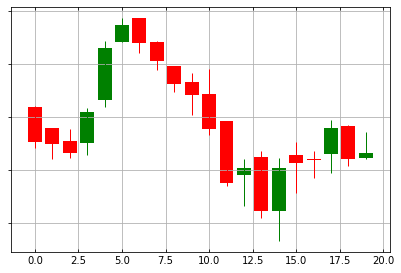

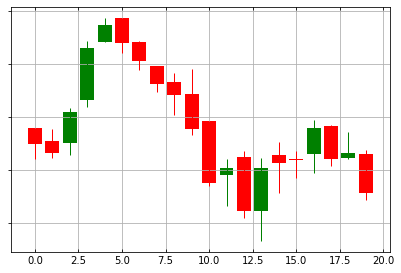

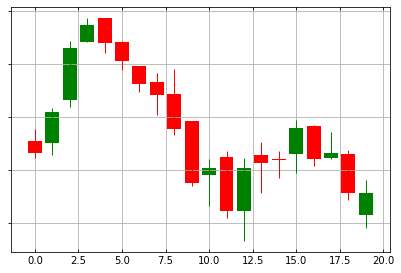

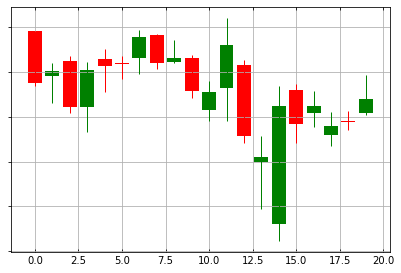

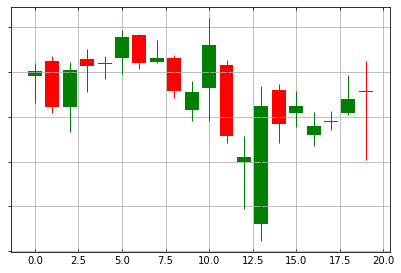

...

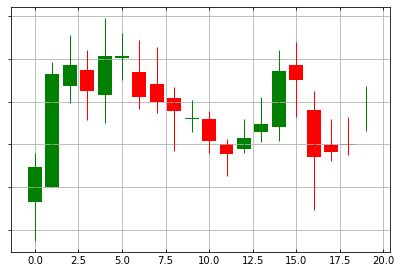

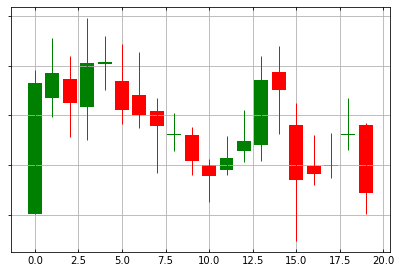

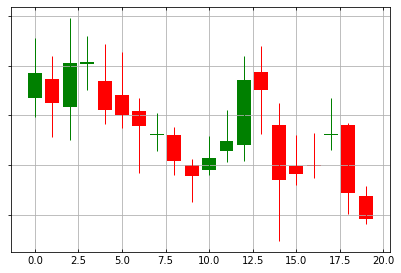

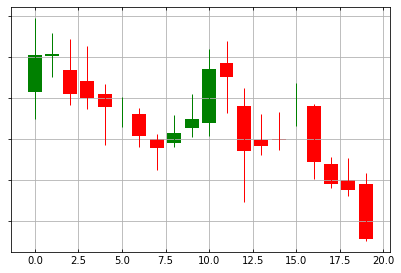

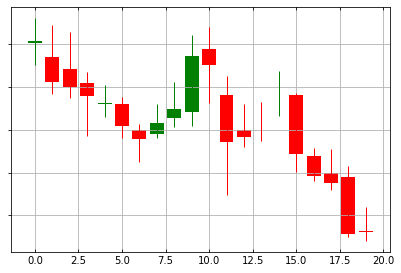

In [10]:
equities=['BAJFINANCE','RELIANCE','INFY','HDFC','HDFCBANK','HDFCLIFE','ZEEL','DELTACORP','ITC','ASIANPAINT']
for equity in equities :
    df_pricing=obtain_data(equity,date(2018,1,1),date(2020,9,1))
    df=df_pricing.copy()
    df=df.reset_index(drop=True)
    n_days=5
    fraction_movement=0.037
    df['Trend']=None
    for i in range(len(df)):
        try :
            for n in range(n_days): 
                if  df.loc[i,'close_price'] - df.loc[i+n,'close_price'] >= fraction_movement*df.loc[i,'close_price']:
                    df.loc[i,'Trend'] ='Down'
                    if i >=20 :
                        fig=plot_candles(df_pricing[i-20:i],volume_bars=False)
                        fig.savefig('Candle Data/Down/{0}{1}.png'.format(df_pricing['Symbol'][i],i),dpi=70)
                    print('Down',i,n)
                    break
                elif df.loc[i+n,'close_price'] - df.loc[i,'close_price'] >= fraction_movement*df.loc[i,'close_price'] :
                    df.loc[i,'Trend']='Up'
                    if i >20 :    
                        fig=plot_candles(df_pricing[i-20:i],volume_bars=False)
                        fig.savefig('Candle Data/Up/{0}{1}.png'.format(df_pricing['Symbol'][i],i),dpi=70)
                    print('Up',i,n)
                    break
                else :
                    df.loc[i,'Trend']= 'No Trend'
        except :
            print(i)
            pass
